# House Prices predictions

## Wykorzystywane biblioteki

In [83]:
import pandas as pd
# pd.set_option('display.max_columns', 500)
from pandas.plotting import scatter_matrix

import numpy as np

import seaborn as sns
sns.set(font='Times New Roman')

import matplotlib.pyplot as plt
import matplotlib_inline
import matplotlib
matplotlib_inline.backend_inline.set_matplotlib_formats('svg')
matplotlib.rcParams['font.family'] = 'Times New Roman'

import missingno as msno

from scipy import stats


from sklearn.impute import SimpleImputer
from sklearn.compose import make_column_selector, make_column_transformer
from sklearn.metrics import mean_squared_error
from sklearn.metrics.pairwise import rbf_kernel
from sklearn.preprocessing import FunctionTransformer, StandardScaler, KBinsDiscretizer, OneHotEncoder
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import train_test_split

from sklearn.linear_model import LinearRegression

import warnings
warnings.filterwarnings('ignore')

import sys
sys.path.append('../../')

from MyMLLibrary import Helper as h


## Wstępna analiza danych

In [2]:
df_train = pd.read_csv('train.csv')
df_train.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [3]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [4]:
df_train.columns

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive

In [5]:
df_train.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1460.000000,1201.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,...,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,730.500000,56.897260,70.049958,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,...,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,421.610009,42.300571,24.284752,9981.264932,1.382997,1.112799,30.202904,20.645407,181.066207,456.098091,...,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,1.000000,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,365.750000,20.000000,59.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,730.500000,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,...,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,1095.250000,70.000000,80.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,...,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,1460.000000,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,...,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


W naszym problemie będziemy próbować przewidzieć wartość `SalePrice`, zatem spójrzmy na szczegółowe dane statystyczne.

In [6]:
df_train['SalePrice'].describe()

count      1460.000000
mean     180921.195890
std       79442.502883
min       34900.000000
25%      129975.000000
50%      163000.000000
75%      214000.000000
max      755000.000000
Name: SalePrice, dtype: float64

Zauważamy, że ceny są typu float64, a ich średnia wynosi ok. 180 tys. dolarów. Najtańszy dom można kupić za ok. 35 tys. dolarów, z kolei najdroższy za ok. 750 tys.

W następnym kroku dokonujemy wizualizacji tej cechy przy pomocy histogramu oraz krzywej kde (krzywa gęstości prawdopodobieństwa -> rozkład obserwacji w zbiorze.)

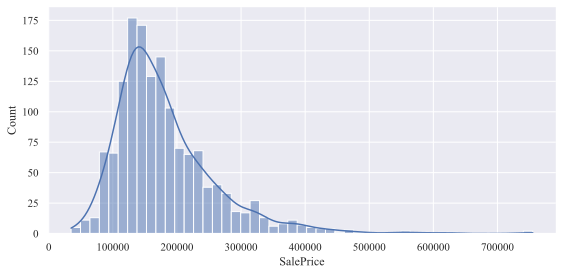

In [7]:
displot = sns.displot(df_train['SalePrice'], kind='hist', kde=True, height=4, aspect=2)

In [8]:
print("Skewness: %f" % df_train['SalePrice'].skew())
print("Kurtosis: %f" % df_train['SalePrice'].kurt())

Skewness: 1.882876
Kurtosis: 6.536282


Zauważamy, że rozkład tej cechy nie jest normalny. Jest prawo skośny (długi prawy ogon) oraz jego kurtoza jest dwukrotnie większa od tej w normalnym rozkładzie. Jest to ważne spostrzeżenie, ponieważ po standaryzacji, taki rozkład zostałby wciśnięty w bardzo mały zakres, a modele ML tego nie lubią. Jednym rozwiązaniem tego problemu będzie (dla dodatnich cech) spierwiatkowanie cechy, jeśli ogon jest baaaardzo długi można użyć logarytmu.

Pozbywamy się kolumn `Id`, ponieważ nic nie wnosi do przewidywania `SalePrice` domu.

In [9]:
df_train.drop(['Id'], axis=1, inplace=True)
df_train.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


Dla cech ilościowych wizualizujemy ich rozkłady przy pomocy histogramów.

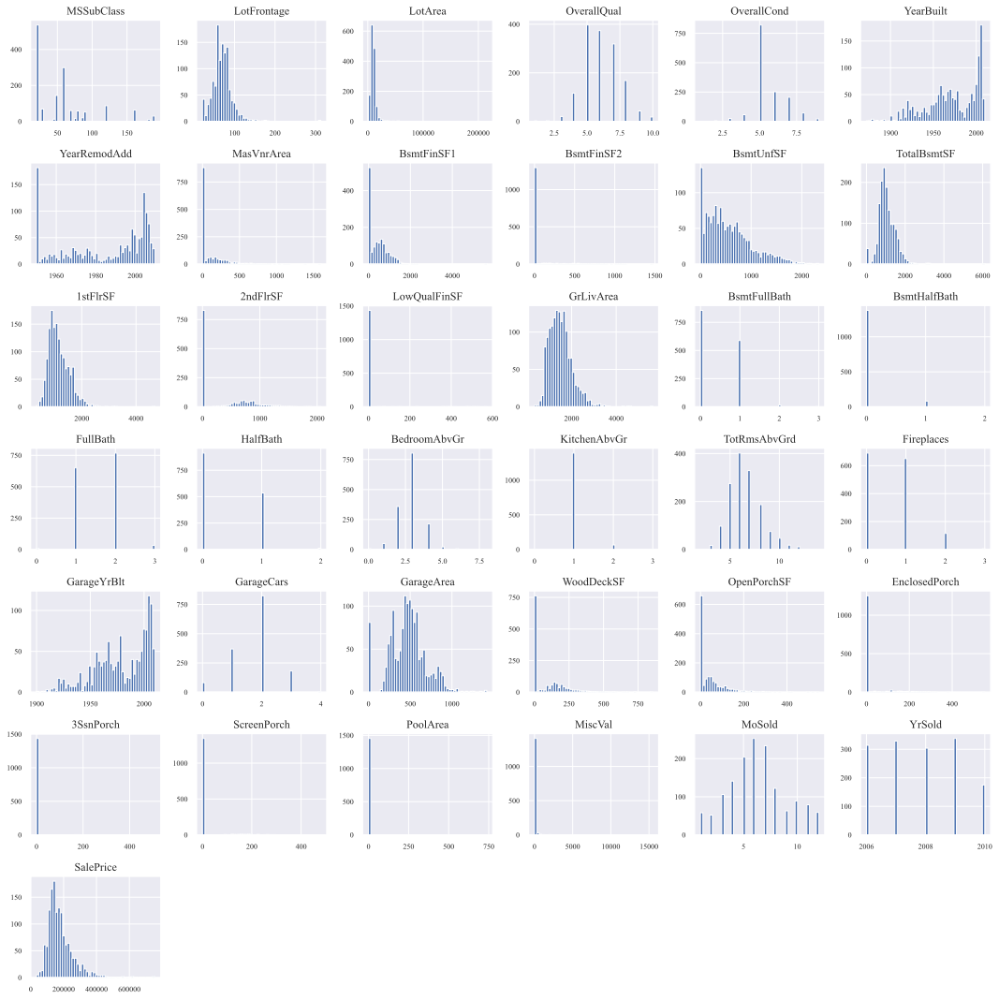

In [10]:
df_train.hist(figsize=(15,15), bins=50, xlabelsize=8, ylabelsize=8)
plt.tight_layout()

Aby dowiedzieć się więcej o zależnościach między cechami liczymy ich współczynniki korealcji (macierz korelacji)

In [11]:
correlation_matrix = df_train.corr(numeric_only=True)

Następnie wizualizujemy macierz. Jasne kolory odpowiadają wysokiej korelacji pozytywnej, a ciemne niskie negatywnej.

<Axes: >

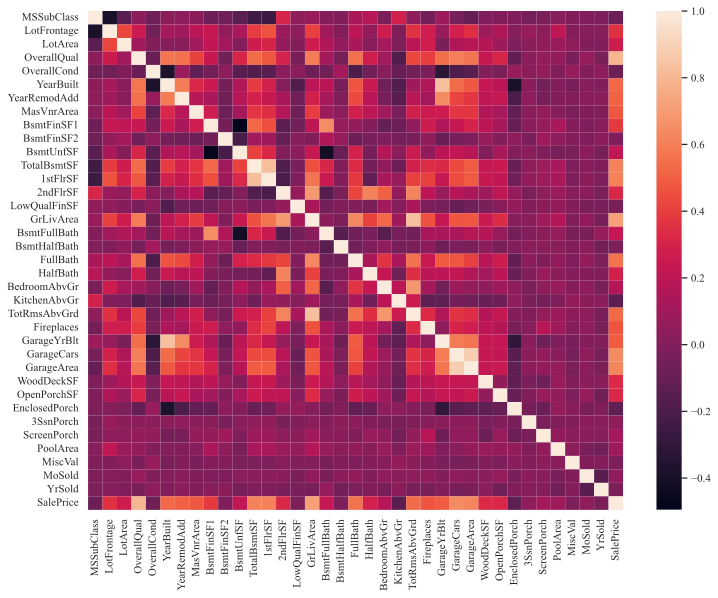

In [12]:
fig, ax = plt.subplots(figsize=(12, 9))
sns.heatmap(correlation_matrix)

W celu lepszej czytelności najbardziej skorelowanych cech ze sobą wybieramy tylko 10 cech o najwyższym współczynniku korelacji.

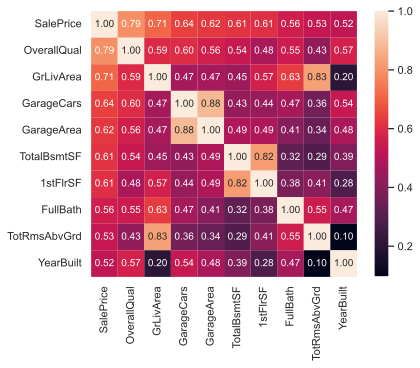

In [13]:
k = 10 
cols = np.abs(correlation_matrix).nlargest(k, 'SalePrice')['SalePrice'].index
cm = np.corrcoef(df_train[cols].values.T)
sns.set(font_scale=1.)
hm = sns.heatmap(cm, cbar=True, annot=True, square=True, fmt='.2f', annot_kws={'size': 10}, yticklabels=cols.values, xticklabels=cols.values)
plt.show()


Innym sposobem wyodrębnienia najbardziej skorelowanych cech jest posortowanie ich i wybranie tych o największym pozytywny lub najmniejszym negatywnym współczynniku.

In [14]:
correlation_matrix['SalePrice'].sort_values(ascending=False)

SalePrice        1.000000
OverallQual      0.790982
GrLivArea        0.708624
GarageCars       0.640409
GarageArea       0.623431
TotalBsmtSF      0.613581
1stFlrSF         0.605852
FullBath         0.560664
TotRmsAbvGrd     0.533723
YearBuilt        0.522897
YearRemodAdd     0.507101
GarageYrBlt      0.486362
MasVnrArea       0.477493
Fireplaces       0.466929
BsmtFinSF1       0.386420
LotFrontage      0.351799
WoodDeckSF       0.324413
2ndFlrSF         0.319334
OpenPorchSF      0.315856
HalfBath         0.284108
LotArea          0.263843
BsmtFullBath     0.227122
BsmtUnfSF        0.214479
BedroomAbvGr     0.168213
ScreenPorch      0.111447
PoolArea         0.092404
MoSold           0.046432
3SsnPorch        0.044584
BsmtFinSF2      -0.011378
BsmtHalfBath    -0.016844
MiscVal         -0.021190
LowQualFinSF    -0.025606
YrSold          -0.028923
OverallCond     -0.077856
MSSubClass      -0.084284
EnclosedPorch   -0.128578
KitchenAbvGr    -0.135907
Name: SalePrice, dtype: float64

Najbardziej obiecujące są cechy: `OverallQual`, `GrLivArea`, `GarageCars` (odrzucamy `GarageArea`, ponieważ bardziej informatywną cechą jest ile garaż samochodów pomieści, cechy te zresztą są bardzo mocno ze sobą skorelowane, bo prawie w 90%), `TotalBsmtSF`, `FullBath`, `YearBuilt`. 

Dla tych cech wizualizujemy ich korelacje poprzez zestawienie ich ze sobą w przestrzeni przy pomocy scatter matrix.

In [15]:
from pandas.plotting import scatter_matrix
attributes = ['SalePrice', 'OverallQual', 'GrLivArea', 'GarageCars', 'TotalBsmtSF', 'FullBath', 'YearBuilt']

scatter_matrix(df_train[attributes], figsize=(15, 15))
plt.tight_layout()
plt.show()

Obserwując ponownie histogramy zauważamy, że cecha `YearBuilt` ma rozkład multimodalny, jest to okazja do skorzystania z kernela rbf np.

Zauważamy też korelację `GrLivArea` z `TotalBsmtSF`, w której piwnica najczęściej ma tę samą powierzchnię co dom lub mniejszą. Zdarzają, się pojedyncze przypadki, w których tak nie jest (rzadko kiedy ktoś ma bunkier pod domem ;)).

Kilka cech numerycznych nie jest ciągłych tylko są reprezentowane przez skalę np. 1-10 tak jak w przypadku np. `OverallQual`, zauważamy również tutaj wysoką korelację jednakże punkty w przestrzeni układają się w pionowe linie.

Niektóre cechy mają brakujące dane. W następnym kroku zostaną usunięte wszystkie te cechy, których procent brakujących danych jest większy niż 85%

Przy pomocy biblioteki missingno próbujemy się dowiedzieć więcej o brakujących danych.

<Axes: >

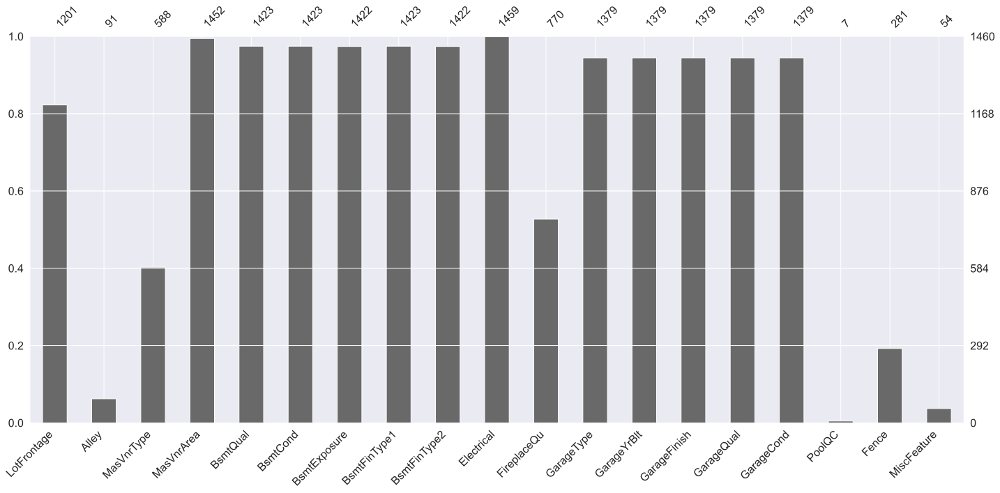

In [16]:
import missingno as msno

data_missing_values = df_train.loc[:, df_train.isnull().any()]

msno.bar(data_missing_values)

<Axes: >

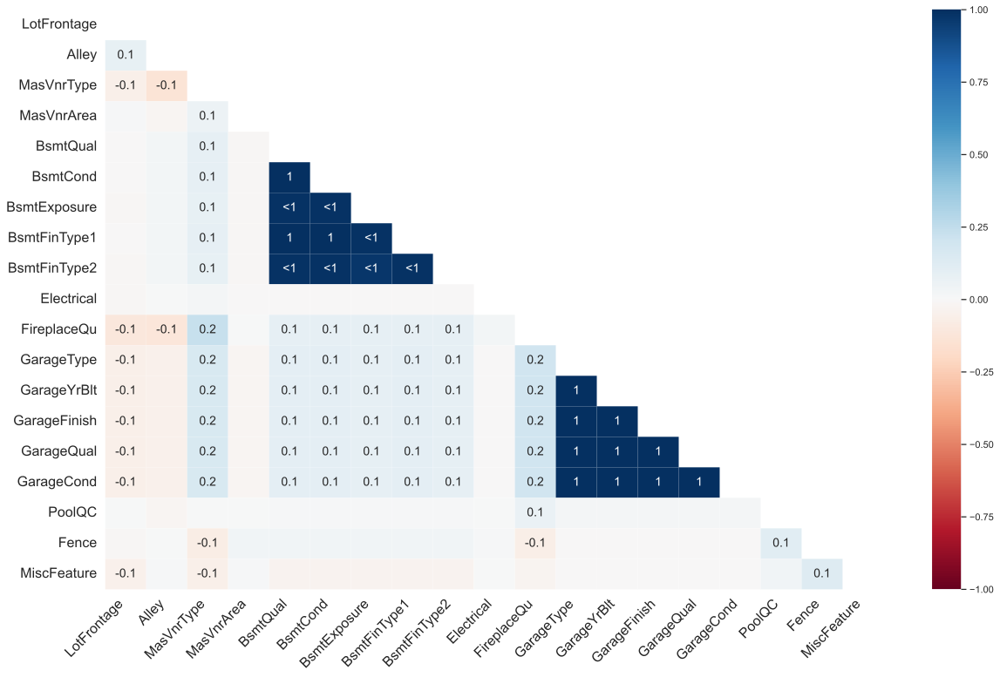

In [17]:
msno.heatmap(data_missing_values)

In [18]:
total = df_train.isnull().sum().sort_values(ascending=False)
percent = (df_train.isnull().sum()/df_train.isnull().count()).sort_values(ascending=False)

missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing_data.head(20)

,Total,Percent
PoolQC,1453,0.995205
MiscFeature,1406,0.963014
Alley,1369,0.937671
Fence,1179,0.807534
MasVnrType,872,0.597260
FireplaceQu,690,0.472603
LotFrontage,259,0.177397
GarageYrBlt,81,0.055479
GarageCond,81,0.055479
GarageType,81,0.055479


Usuwamy te kolumny, których procent brakujących danych wyniósł ponad 85%.

In [19]:
df_train.drop((missing_data[missing_data['Total'] > 0.85*len(df_train.index)]).index, axis=1, inplace=True)

Zauważam wysoką korelację na poziomie 80% `GarageYrBlt` z `YearBuilt`, więc postanawiam uzupełnić brakujące dane `GarageYrBlt` rokiem budowy domu.

In [20]:
df_train['GarageYrBlt'].fillna(df_train['YearBuilt'], inplace=True)

W kolumnie `Electrical` brakuje tylko jednej danej dlatego usuwam obserwację z brakującą cechą.

In [21]:
df_train.drop(df_train.loc[df_train['Electrical'].isnull()].index, inplace=True)
df_train.isnull().sum().max()

1178

W pozostałych przypadkach brak danych wynika z tego, że danego obiektu nie ma i nie można było go ocenić. Te wartości postanowiłam zastąpić stringiem 'NotExist'.

Natomiast w przypadku `LotFrontage` brakujące dane postanowiłam zastąpić medianą.

Przy pomocy ColumnTransformera generujemy powyższe uzupełnianie danych przy pomocy jednej komendy i uzyskujemy nowy dataframe bez brakujących danych.

In [22]:
missing = make_column_transformer(
    (SimpleImputer(strategy="median"), make_column_selector(dtype_include=np.number)),
    (SimpleImputer(strategy="constant", fill_value="NotExist"), make_column_selector(dtype_include=object)),
    remainder="passthrough",
    verbose_feature_names_out=False
).set_output(transform="pandas")

missing

ColumnTransformer(remainder='passthrough',
                  transformers=[('simpleimputer-1',
                                 SimpleImputer(strategy='median'),
                                 <sklearn.compose._column_transformer.make_column_selector object at 0x174613100>),
                                ('simpleimputer-2',
                                 SimpleImputer(fill_value='NotExist',
                                               strategy='constant'),
                                 <sklearn.compose._column_transformer.make_column_selector object at 0x174613850>)],
                  verbose_feature_names_out=False)

In [23]:
result = missing.fit_transform(df_train)

In [24]:
result.head()

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,...,Functional,FireplaceQu,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,Fence,SaleType,SaleCondition
0,60.0,65.0,8450.0,7.0,5.0,2003.0,2003.0,196.0,706.0,0.0,...,Typ,NotExist,Attchd,RFn,TA,TA,Y,NotExist,WD,Normal
1,20.0,80.0,9600.0,6.0,8.0,1976.0,1976.0,0.0,978.0,0.0,...,Typ,TA,Attchd,RFn,TA,TA,Y,NotExist,WD,Normal
2,60.0,68.0,11250.0,7.0,5.0,2001.0,2002.0,162.0,486.0,0.0,...,Typ,TA,Attchd,RFn,TA,TA,Y,NotExist,WD,Normal
3,70.0,60.0,9550.0,7.0,5.0,1915.0,1970.0,0.0,216.0,0.0,...,Typ,Gd,Detchd,Unf,TA,TA,Y,NotExist,WD,Abnorml
4,60.0,84.0,14260.0,8.0,5.0,2000.0,2000.0,350.0,655.0,0.0,...,Typ,TA,Attchd,RFn,TA,TA,Y,NotExist,WD,Normal


In [25]:
result_cat = result.select_dtypes(include=[object])
result_cat.head()

,MSZoning,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,...,Functional,FireplaceQu,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,Fence,SaleType,SaleCondition
0,RL,Pave,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,...,Typ,NotExist,Attchd,RFn,TA,TA,Y,NotExist,WD,Normal
1,RL,Pave,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,...,Typ,TA,Attchd,RFn,TA,TA,Y,NotExist,WD,Normal
2,RL,Pave,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,...,Typ,TA,Attchd,RFn,TA,TA,Y,NotExist,WD,Normal
3,RL,Pave,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,...,Typ,Gd,Detchd,Unf,TA,TA,Y,NotExist,WD,Abnorml
4,RL,Pave,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,...,Typ,TA,Attchd,RFn,TA,TA,Y,NotExist,WD,Normal


Następnie wizualizuje przy pomocy boxplot rozkłady poszczególnych atrybutów dla poszczególnej kategorii/cechy w zestawieniu z cecha `SalePrice`.

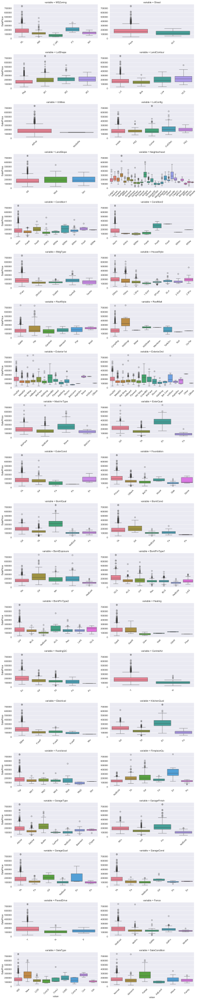

In [26]:
f = pd.melt(result, id_vars=["SalePrice"], value_vars=result_cat)
g = sns.FacetGrid(f, col="variable", col_wrap=2, sharex=False, sharey=False, height=3.5, aspect=2)

g.map_dataframe(sns.boxplot, x="value", y="SalePrice", hue="value", palette="husl")

g.set_xticklabels(rotation=45)
g.set(yticks=range(0, 800000, 100000))

plt.tight_layout()
plt.show()

Po analizie boxplotów zauważam, że niższa cena jest zazwyczaj związana z wartością cechy "NotExist", czyli brakiem basenu, piwnicy itd.

Obserwuję ponownie histogramy, aby sprawdzić, które rozkłady trzeba przed skalowanie zmodyfikować.

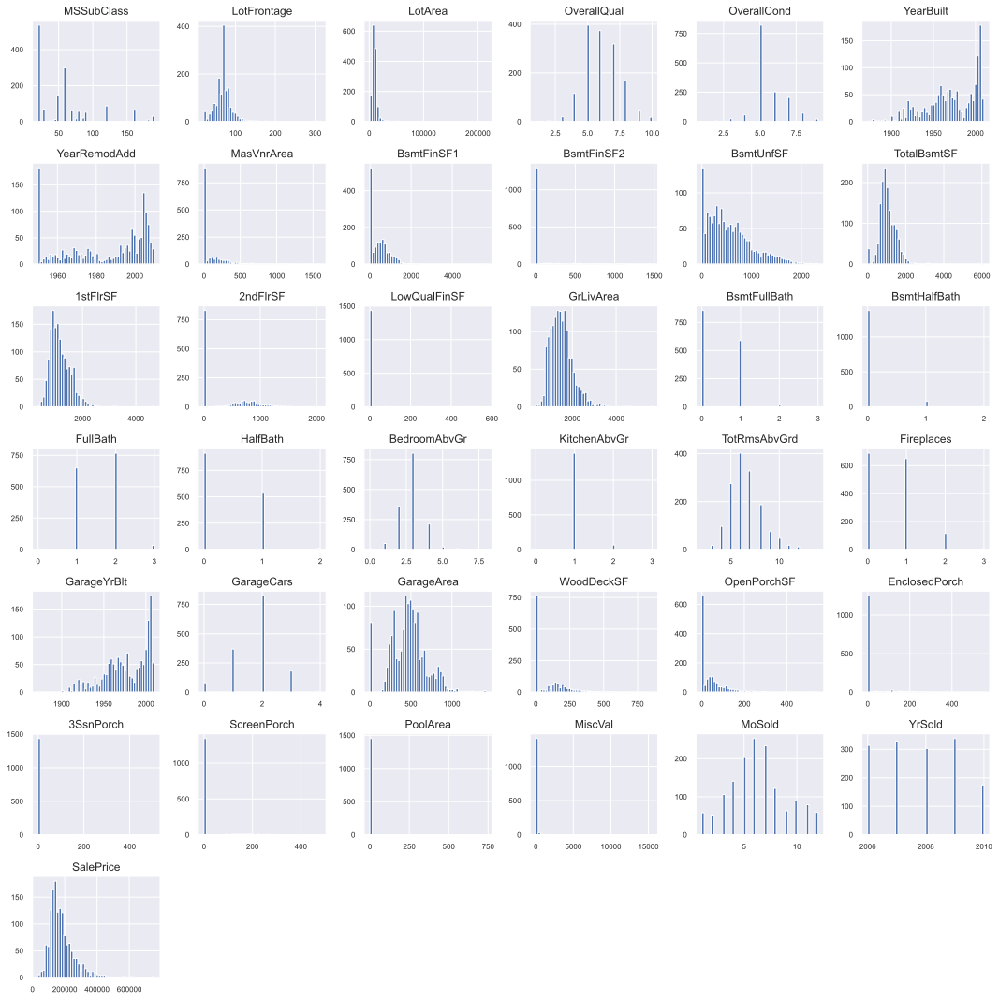

In [27]:
result.hist(figsize=(15,15), bins=50, xlabelsize=8, ylabelsize=8)
plt.tight_layout()

Przed skalowaniem danych wybrałam trzy ścieżki, według których dane zostaną odpowiednio przystosowane do uczenia modelu:
- dodanie cechy dla pików w rozkładach wielomodalnych,
- zlogarytmowanie rozkładów skośnych,
- zbucketyzowanie cech, w których w zerze jest bardzo wysoki pik.

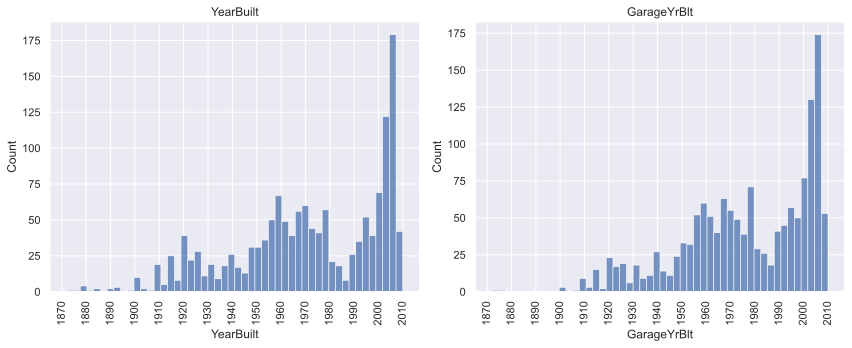

In [28]:
import matplotlib.pyplot as plt
import seaborn as sns

fig, axes = plt.subplots(1, 2, figsize=(12, 5))

bin_count = 50
xticks = range(1870, 2020, 10)
xticklabels = [str(x) for x in xticks]

sns.histplot(result['YearBuilt'], bins=bin_count, ax=axes[0])
axes[0].set_xticks(xticks)
axes[0].set_xticklabels(xticklabels, rotation=90)
axes[0].set_title('YearBuilt')

sns.histplot(result['GarageYrBlt'], bins=bin_count, ax=axes[1])
axes[1].set_xticks(xticks)
axes[1].set_xticklabels(xticklabels, rotation=90)
axes[1].set_title('GarageYrBlt')

plt.tight_layout()
plt.show()


Mamy cztery wyraźne piki w roku 1920, 1940, 1960 oraz w 2005

In [29]:
multimodal_attr = ['YearBuilt', 'GarageYrBlt']
# attributes = ['LotFrontage', 'LotArea', '1stFlrSF', 'GrLivArea', 'SalePrice']
attributes = ['1stFlrSF', 'GrLivArea']
attr_to_bucketize = ['YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '2ndFlrSF', 'LowQualFinSF', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal']

Najpierw użyję jądra rbf, aby dodać cztery kolumny dla poszczególnych pików, ponieważ może modelują jakieś ciekawe zależności. Wyznaczymy miarę podobieństwa dla poszczególnych pików.

In [30]:
def names(transformer, input):
    Y = transformer.get_params()['kw_args']['Y']
    result = []
    for elem in Y:
        result.append(f'{input[0]}_{elem[0]}')
    
    return result

preprocessor_year = make_column_transformer(
    (FunctionTransformer(rbf_kernel, kw_args=dict(Y=[[1920]], gamma=0.02), feature_names_out=names), ['YearBuilt']),
    (FunctionTransformer(rbf_kernel, kw_args=dict(Y=[[1940]], gamma=0.1), feature_names_out=names), ['YearBuilt']),
    (FunctionTransformer(rbf_kernel, kw_args=dict(Y=[[1960]], gamma=0.01), feature_names_out=names), ['YearBuilt']),
    (FunctionTransformer(rbf_kernel, kw_args=dict(Y=[[2005]], gamma=0.01), feature_names_out=names), ['YearBuilt']),
    ('passthrough', ['YearBuilt']),
    remainder="passthrough",
    verbose_feature_names_out=False
).set_output(transform='pandas')

kernel_result = preprocessor_year.fit_transform(result.sort_values(by='YearBuilt'))


kernel_result


,YearBuilt_1920,YearBuilt_1940,YearBuilt_1960,YearBuilt_2005,YearBuilt,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,...,Functional,FireplaceQu,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,Fence,SaleType,SaleCondition
1349,9.720985e-21,1.521359e-201,2.334723e-34,1.505390e-77,1872.0,70.0,50.0,5250.0,8.0,5.0,...,Typ,NotExist,NotExist,NotExist,NotExist,NotExist,Y,NotExist,WD,Normal
1137,2.576757e-18,3.240271e-184,4.190093e-32,4.020060e-74,1875.0,50.0,54.0,6342.0,5.0,8.0,...,Typ,NotExist,NotExist,NotExist,NotExist,NotExist,N,NotExist,WD,Normal
747,1.266417e-14,4.508027e-157,1.603811e-28,1.385119e-68,1880.0,70.0,65.0,11700.0,7.0,7.0,...,Typ,Gd,Detchd,Unf,TA,TA,N,NotExist,WD,Normal
304,1.266417e-14,4.508027e-157,1.603811e-28,1.385119e-68,1880.0,75.0,87.0,18386.0,7.0,9.0,...,Typ,Ex,Attchd,Unf,TA,TA,Y,NotExist,WD,Normal
1132,1.266417e-14,4.508027e-157,1.603811e-28,1.385119e-68,1880.0,70.0,90.0,9900.0,6.0,4.0,...,Typ,NotExist,Detchd,Unf,Fa,TA,N,NotExist,WD,Normal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
507,1.581496e-69,1.707643e-207,3.737571e-11,8.521438e-01,2009.0,20.0,75.0,7862.0,6.0,5.0,...,Typ,NotExist,Attchd,Fin,TA,TA,Y,NotExist,New,Partial
460,1.581496e-69,1.707643e-207,3.737571e-11,8.521438e-01,2009.0,60.0,75.0,8004.0,8.0,5.0,...,Typ,NotExist,BuiltIn,Fin,TA,TA,Y,NotExist,New,Partial
103,1.581496e-69,1.707643e-207,3.737571e-11,8.521438e-01,2009.0,20.0,94.0,10402.0,7.0,5.0,...,Typ,NotExist,Attchd,RFn,TA,TA,Y,NotExist,WD,Normal
914,1.581496e-69,1.707643e-207,3.737571e-11,8.521438e-01,2009.0,160.0,30.0,3000.0,6.0,5.0,...,Typ,NotExist,Detchd,RFn,TA,TA,Y,NotExist,New,Partial


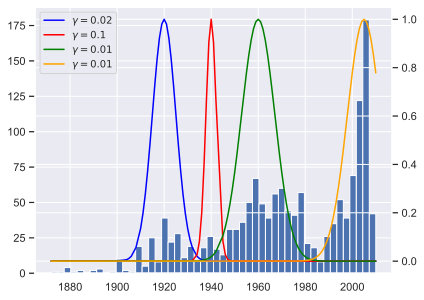

In [31]:
fig, ax1 = plt.subplots()

ax1.hist(result["YearBuilt"], bins=50)

ax2 = ax1.twinx() 
ax2.plot(kernel_result["YearBuilt"], kernel_result["YearBuilt_1920"], color="blue", label=r"$\gamma = 0.02$")
ax2.plot(kernel_result["YearBuilt"], kernel_result["YearBuilt_1940"], color="red", label=r"$\gamma = 0.1$")
ax2.plot(kernel_result["YearBuilt"], kernel_result["YearBuilt_1960"], color="green", label=r"$\gamma = 0.01$")
ax2.plot(kernel_result["YearBuilt"], kernel_result["YearBuilt_2005"], color="orange", label=r"$\gamma = 0.01$")

ax2.legend(loc="upper left", fontsize="small")

plt.show()


In [32]:
preprocessor_garage = make_column_transformer(
    (FunctionTransformer(rbf_kernel, kw_args=dict(Y=[[1920]], gamma=0.02), feature_names_out=names), ['GarageYrBlt']),
    (FunctionTransformer(rbf_kernel, kw_args=dict(Y=[[1940]], gamma=0.1), feature_names_out=names), ['GarageYrBlt']),
    (FunctionTransformer(rbf_kernel, kw_args=dict(Y=[[1960]], gamma=0.01), feature_names_out=names), ['GarageYrBlt']),
    (FunctionTransformer(rbf_kernel, kw_args=dict(Y=[[2005]], gamma=0.01), feature_names_out=names), ['GarageYrBlt']),
    ('passthrough', ['GarageYrBlt']),
    remainder="passthrough",
    verbose_feature_names_out=False
).set_output(transform='pandas')


kernel_result = preprocessor_garage.fit_transform(kernel_result.sort_values(by='GarageYrBlt'))

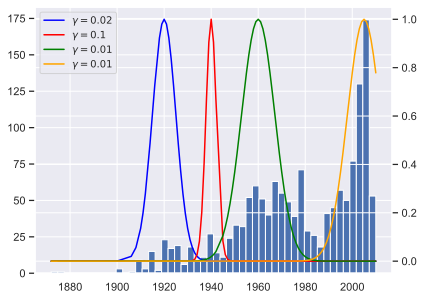

In [33]:
fig, ax1 = plt.subplots()

ax1.hist(kernel_result["GarageYrBlt"], bins=50)

ax2 = ax1.twinx() 

ax2.plot(kernel_result["GarageYrBlt"], kernel_result["GarageYrBlt_1920"], color="blue", label=r"$\gamma = 0.02$")
ax2.plot(kernel_result["GarageYrBlt"], kernel_result["GarageYrBlt_1940"], color="red", label=r"$\gamma = 0.1$")
ax2.plot(kernel_result["GarageYrBlt"], kernel_result["GarageYrBlt_1960"], color="green", label=r"$\gamma = 0.01$")
ax2.plot(kernel_result["GarageYrBlt"], kernel_result["GarageYrBlt_2005"], color="orange", label=r"$\gamma = 0.01$")

ax2.legend(loc="upper left", fontsize="small")

plt.show()


Teraz czas na zmodyfikowanie rozkładów prawdopodobieństwa dla danych ciągłych, żeby przypominały rozkład normalny.

In [34]:
distribution = make_column_transformer(
    (FunctionTransformer(np.log, feature_names_out='one-to-one', inverse_func=np.exp), attributes),
    remainder="passthrough",
    verbose_feature_names_out=False
    ).set_output(transform="pandas")

result2 = distribution.fit_transform(kernel_result)

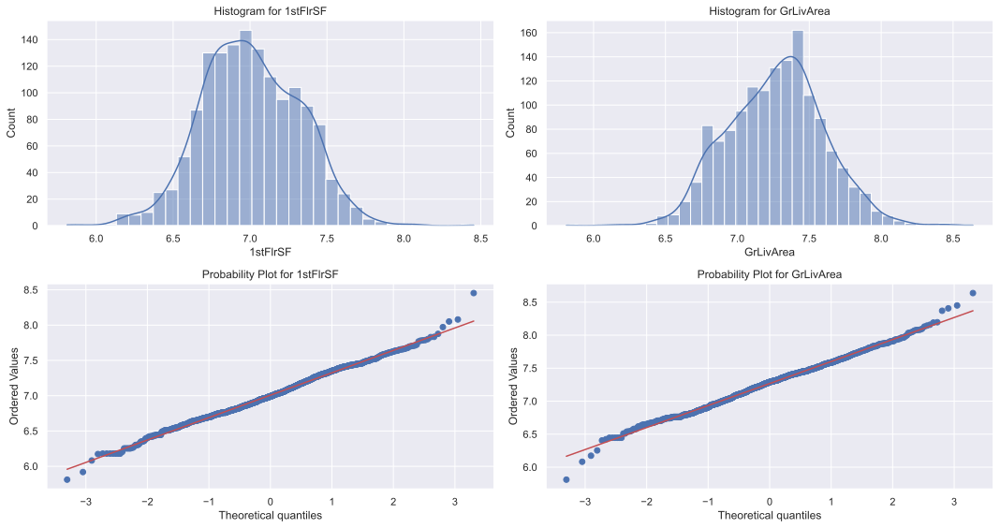

In [35]:
fig, axes = plt.subplots(2, len(attributes), figsize=(15, 8))

for i, attribute in enumerate(attributes):
    sns.histplot(result2[attribute], kde=True, ax=axes[0, i])
    axes[0, i].set_title(f'Histogram for {attribute}')
    
    res = stats.probplot(result2[attribute], plot=axes[1, i])
    axes[1, i].set_title(f'Probability Plot for {attribute}')

plt.tight_layout()
plt.show()

Następnie bucketyzuje cechy, w których odnotowałam bardzo wysoki pik np. w 0, który zakłóca rozkład wartości.

In [36]:
discretizer = make_column_transformer(
    (KBinsDiscretizer(n_bins=5, encode="onehot-dense", strategy="kmeans"), attr_to_bucketize),
    # ("passthrough", attr_to_bucketize),
    remainder='passthrough',
    verbose_feature_names_out=False
).set_output(transform="pandas")

result3 = discretizer.fit_transform(result2)

/Users/joannaadamczyk/opt/anaconda3/envs/ML/lib/python3.9/site-packages/sklearn/preprocessing/_discretization.py:248: FutureWarning: In version 1.5 onwards, subsample=200_000 will be used by default. Set subsample explicitly to silence this warning in the mean time. Set subsample=None to disable subsampling explicitly.
  warnings.warn(
/Users/joannaadamczyk/opt/anaconda3/envs/ML/lib/python3.9/site-packages/sklearn/base.py:1152: ConvergenceWarning: Number of distinct clusters (3) found smaller than n_clusters (5). Possibly due to duplicate points in X.
  return fit_method(estimator, *args, **kwargs)


In [37]:
final_preprocess = make_column_transformer(
    (StandardScaler(), make_column_selector(dtype_include=np.number)),
    (OneHotEncoder(sparse_output=False), make_column_selector(dtype_include=object)),
    remainder="passthrough",
    verbose_feature_names_out=False
).set_output(transform="pandas")

In [38]:
houses = final_preprocess.fit_transform(result3)
houses['SalePrice']

1349   -0.741807
1137   -1.094266
93     -0.592011
921    -0.440957
520    -0.940065
          ...   
178     4.039522
211     0.063815
987     2.697092
819     0.542153
378     2.687525
Name: SalePrice, Length: 1459, dtype: float64

Powyższe transformacje kolumn zapisuje przy pomocy funkcji.

## Czyszczenie i przygotowanie danych do treningu 

In [105]:
multimodal_attr = ['YearBuilt', 'GarageYrBlt']
# attributes = ['LotFrontage', 'LotArea', '1stFlrSF', 'GrLivArea', 'SalePrice']
attributes = ['1stFlrSF', 'GrLivArea']
attr_to_bucketize = ['YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '2ndFlrSF', 'LowQualFinSF', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal']

def drop_columns(data):
    total = data.isnull().sum().sort_values(ascending=False)
    percent = (data.isnull().sum()/data.isnull().count()).sort_values(ascending=False)

    missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])

    return data.drop((missing_data[missing_data['Total'] > 0.85*len(data.index)]).index, axis=1)

def fill_GarageYrBlt(data):
    data['GarageYrBlt'].fillna(data['YearBuilt'])
    return data


def missing_data(data):
    data = drop_columns(data)
    return fill_GarageYrBlt(data)



def preprocessing(data, split=False):

    preproc1 = make_column_transformer(
        (SimpleImputer(strategy="median"), make_column_selector(dtype_include=np.number)),
        (SimpleImputer(strategy="constant", fill_value="NotExist"), make_column_selector(dtype_include=object)),
        remainder="passthrough",
        verbose_feature_names_out=False
    ).set_output(transform='pandas')

    preproc2 = make_column_transformer(
        (FunctionTransformer(rbf_kernel, kw_args=dict(Y=[[1920]], gamma=0.02), feature_names_out=names), ['YearBuilt']),
        (FunctionTransformer(rbf_kernel, kw_args=dict(Y=[[1940]], gamma=0.1), feature_names_out=names), ['YearBuilt']),
        (FunctionTransformer(rbf_kernel, kw_args=dict(Y=[[1960]], gamma=0.01), feature_names_out=names), ['YearBuilt']),
        (FunctionTransformer(rbf_kernel, kw_args=dict(Y=[[2005]], gamma=0.01), feature_names_out=names), ['YearBuilt']),

        (FunctionTransformer(rbf_kernel, kw_args=dict(Y=[[1920]], gamma=0.02), feature_names_out=names), ['GarageYrBlt']),
        (FunctionTransformer(rbf_kernel, kw_args=dict(Y=[[1940]], gamma=0.1), feature_names_out=names), ['GarageYrBlt']),
        (FunctionTransformer(rbf_kernel, kw_args=dict(Y=[[1960]], gamma=0.01), feature_names_out=names), ['GarageYrBlt']),
        (FunctionTransformer(rbf_kernel, kw_args=dict(Y=[[2005]], gamma=0.01), feature_names_out=names), ['GarageYrBlt']),

        ('passthrough', ['YearBuilt', 'GarageYrBlt']),
        remainder="passthrough",
        verbose_feature_names_out=False

    ).set_output(transform='pandas')

    preproc3 = make_column_transformer(
        (FunctionTransformer(np.log, feature_names_out='one-to-one', inverse_func=np.exp), attributes),
        remainder="passthrough",
        verbose_feature_names_out=False

    ).set_output(transform='pandas')

    preproc4 = make_column_transformer(
        (StandardScaler(), make_column_selector(dtype_include=np.number)),
        remainder="passthrough",
        verbose_feature_names_out=False

    ).set_output(transform='pandas')

    preproc5 = make_column_transformer(
        (KBinsDiscretizer(n_bins=5, encode="onehot-dense", strategy="kmeans"), attr_to_bucketize),
        remainder="passthrough",
        verbose_feature_names_out=False

    ).set_output(transform='pandas')

    preproc6 = make_column_transformer(
        (OneHotEncoder(sparse_output=False), make_column_selector(dtype_include=object)),
        remainder="passthrough",
        verbose_feature_names_out=False

    ).set_output(transform='pandas')

    data.drop(['Id'], axis=1, inplace=True)

    scaler = make_pipeline(
        FunctionTransformer(np.log, inverse_func=np.exp),
        StandardScaler()
        )
    scaled_labels = scaler.fit_transform(data[['SalePrice']])

    outcome = missing_data(data)

    outcome = preproc1.fit_transform(outcome)
    outcome = preproc2.fit_transform(outcome)
    outcome = preproc3.fit_transform(outcome)
    outcome = preproc4.fit_transform(outcome)
    outcome = preproc5.fit_transform(outcome)
    outcome = preproc6.fit_transform(outcome)

    if split:
        sale_price_disc = KBinsDiscretizer(n_bins=5, encode="ordinal", strategy="uniform")

        outcome['SalePriceCategory'] = sale_price_disc.fit_transform(outcome['SalePrice'].values.reshape(-1, 1))


        # train_set, val_set = train_test_split(outcome, 
        #                                     test_size=0.2, 
        #                                     random_state=42)

        strat_train_set, strat_val_set = train_test_split(outcome, 
                                                        test_size=0.2, 
                                                        stratify=outcome['SalePriceCategory'], 
                                                        random_state=42)
        
        # compared_proportions = h.compare_proportions(outcome, strat_train_set, train_set, 'SalePriceCategory')
        # print((compared_proportions * 100).round(2))
        
        for set_ in (strat_train_set,  strat_val_set, outcome):
            set_.drop("SalePriceCategory", axis=1, inplace=True)
        
        return scaler, scaled_labels, strat_train_set, strat_val_set 

    return scaler, scaled_labels, outcome


In [106]:
train_data = pd.read_csv('train.csv')
scaler, scaled_labels, strat_train_set, strat_val_set  = preprocessing(train_data, True)
strat_train_set

,MSZoning_C (all),MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_Grvl,Street_Pave,LotShape_IR1,LotShape_IR2,LotShape_IR3,...,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageCars,MoSold,YrSold,SalePrice
1007,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,...,-1.026041,1.227585,0.163779,-0.211454,-0.318683,-0.951226,-1.026858,0.620891,0.891994,-1.170067
687,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,...,0.789741,1.227585,-1.062465,-0.211454,-1.549576,-0.951226,0.311725,-1.229111,-0.614439,-0.404471
236,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.789741,-0.761621,0.163779,-0.211454,-0.318683,-0.951226,0.311725,-0.489110,1.645210,0.057656
622,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,...,-1.026041,-0.761621,0.163779,-0.211454,-0.318683,-0.951226,0.311725,0.250891,0.891994,-0.578241
35,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,...,2.605522,1.227585,1.390023,-0.211454,1.527656,0.600495,1.650307,0.990891,-1.367655,1.612773
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1186,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,...,0.789741,-0.761621,0.163779,4.328579,0.296763,-0.951226,0.311725,0.620891,0.891994,-1.081923
338,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.789741,-0.761621,0.163779,-0.211454,0.912210,-0.951226,0.311725,-0.489110,-1.367655,0.271721
856,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,...,-1.026041,-0.761621,0.163779,-0.211454,-0.934130,-0.951226,0.311725,1.360892,0.138777,-0.427137
497,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.789741,-0.761621,1.390023,-0.211454,0.912210,-0.951226,-1.026858,-0.119110,0.138777,0.038768


In [107]:
train = strat_train_set.drop("SalePrice", axis=1)
train_labels = strat_train_set["SalePrice"].copy()

In [108]:
lin_reg = LinearRegression()
lin_reg.fit(train, train_labels)
pred = lin_reg.predict(train)

In [109]:
pred[:5]
scaler.inverse_transform(pred[:5].reshape(-1,1))

array([[ 98874.55617771],
       [144127.13086893],
       [172310.08217842],
       [126909.29082249],
       [319869.2328632 ]])

In [110]:
train_labels[:5].values
scaler.inverse_transform(train_labels[:5].values.reshape(-1,1))

array([[104487.80296784],
       [141851.99124705],
       [170599.50126781],
       [132342.7567905 ],
       [317443.53946903]])